# Read in data

In [19]:
import pandas as pd
from pathlib import Path

# -------------------------------------------------------------------------
# 1. locate the workbook
xls_path = Path(r'D:\VScode\OSL_source_ana\data\OSL_ratio.xlsx')

# 2. pull all sheets into a dict   {sheet_name: DataFrame}
sheets = pd.read_excel(xls_path, sheet_name=None, engine='openpyxl')

# 3. make one DataFrame variable per sheet
#    -> df_527, df_514, …
globals().update({f"df_{name}": df for name, df in sheets.items()})

# -------------------------------------------------------------------------
#  ▸ from here on you can use the individual DataFrames directly
# -------------------------------------------------------------------------
# print(df_527.head())   #   sheet “527”
# print(df_514.shape)    #   sheet “514”

df_527.info

<bound method DataFrame.info of   Unnamed: 0          9         21         24          26         40  \
0         S0  47.578947  66.210526  76.315789  256.263158  40.684211   
1         S2  31.736842  35.315789  44.684211  286.947368  38.473684   
2         S5  38.842105  37.947368  49.578947  244.684211  20.526316   
3        S10  37.421053  39.684211  59.210526  249.105263  41.526316   
4        S15  51.368421  57.473684  58.684211  300.368421  36.736842   

           62          71         80         23  ...          33          57  \
0   93.842105  220.052632  33.789474  68.473684  ...  101.736842   91.947368   
1   92.631579  283.368421  37.368421  62.052632  ...   77.684211  110.789474   
2   91.578947  234.157895  45.894737  74.315789  ...   92.789474  110.526316   
3  153.000000  238.368421  42.105263  78.210526  ...   82.894737  193.368421   
4  128.000000  297.421053  54.421053  86.210526  ...   90.263158  235.263158   

          81         27         47         99       25

# Analyze data distribution

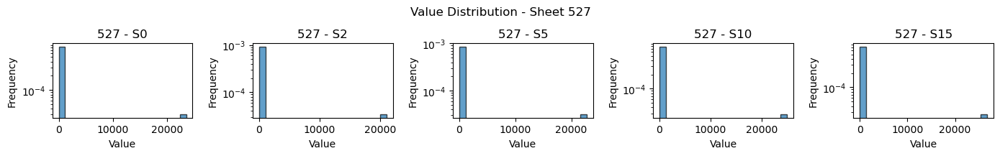

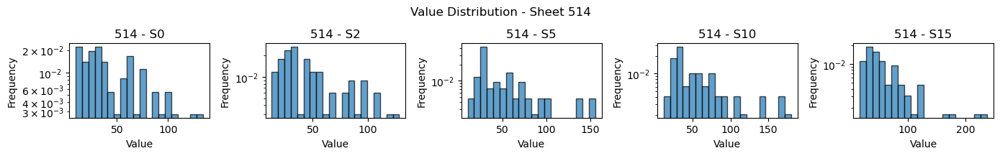

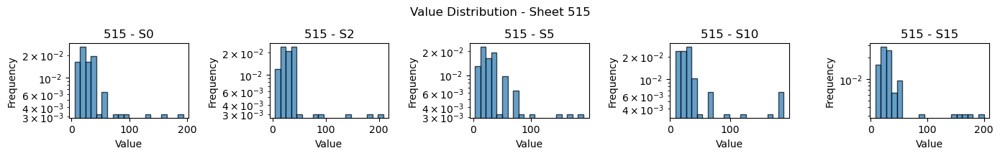

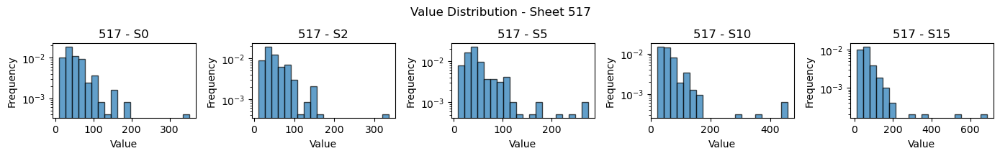

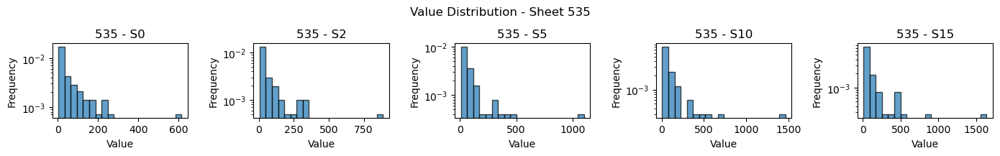

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Reload your data (if needed)
xls_path = Path(r'D:\VScode\OSL_source_ana\data\OSL_ratio.xlsx')
sheets = pd.read_excel(xls_path, sheet_name=None, engine='openpyxl')

# Plot histograms for each row in all sheets
for sheet_name, df in sheets.items():
    plt.figure(figsize=(14, 8))
    
    # Extract row names and numeric data (exclude first column "Unnamed: 0")
    row_names = df.iloc[:, 0].tolist()  # ["S0", "S2", ...]
    data = df.iloc[:, 1:].values  # Numeric values only
    
    # Create subplots for each row
    n_rows = len(row_names)
    n_cols = 5  # Adjust based on your preference
    for idx, (row_name, row_data) in enumerate(zip(row_names, data)):
        plt.subplot(n_rows, n_cols, idx + 1)
        plt.hist(row_data, bins=20, alpha=0.7, edgecolor='k',density=True)
        plt.title(f"{sheet_name} - {row_name}")
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.yscale('log')  # Use log scale if values vary widely
    
    plt.tight_layout()
    plt.suptitle(f"Value Distribution - Sheet {sheet_name}", y=1.02)
    plt.show()

# 画图，颜色代表比值，大小代表原始值，大小分为n级

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math                    # new: for floor / ceil helpers

def process_and_plot(df, n_grades: int = 5,
                     yticks_labels=('S2/S0', 'S5/S0', 'S10/S0', 'S15/S0'), cmap='viridis',dpi=100):
    # ---------- 1. ratio & sorting ----------
    numeric_cols = df.columns[1:]
    ratio_df = df.iloc[1:].copy()
    ratio_df[numeric_cols] = df.iloc[1:][numeric_cols].div(df.iloc[0][numeric_cols].values)

    means = ratio_df[numeric_cols].mean()
    sorted_columns = [df.columns[0]] + means.sort_values(ascending=False).index.tolist()
    ratio_df_sorted = ratio_df[sorted_columns]
    original_df_sorted = df[sorted_columns]

    # ---------- 2. mesh for scatter ----------
    n_rows, n_cols = ratio_df_sorted.shape[0], len(sorted_columns) - 1
    x, y = np.meshgrid(np.arange(n_cols), np.arange(n_rows))
    x, y = x.flatten(), y.flatten()

    colors = ratio_df_sorted.iloc[:, 1:].values.flatten()
    raw_sizes = original_df_sorted.iloc[1:, 1:].values.flatten()

    # ---------- 3. quantile‑based bubble sizes ----------
    quant_edges = np.quantile(raw_sizes, np.linspace(0, 1, n_grades + 1))
    grade_sizes = np.linspace(150, 900, n_grades)
    grade_idx = np.digitize(raw_sizes, quant_edges[1:-1], right=True)
    sizes_for_plot = grade_sizes[grade_idx]

    # ---------- 4. adaptive figure width ----------
    col_width = 0.6
    fig_w = max(6, col_width * n_cols)
    fig_h = 6
    fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi)

    scatter = plt.scatter(
        x, y,
        c=colors,
        s=sizes_for_plot,
        cmap=cmap,
        alpha=0.6,
        edgecolors='w',
        linewidth=0.5
    )
    plt.colorbar(scatter, label='Ratio (Sx / S0)', shrink=0.8)

    # ---------- 5. axis ticks ----------
    plt.xticks(np.arange(n_cols), labels=sorted_columns[1:], rotation=45, ha='right')
    plt.yticks(np.arange(n_rows),
               yticks_labels if len(yticks_labels) == n_rows else ratio_df_sorted.iloc[:, 0])

    plt.xlabel('Slice number')
    plt.ylabel('Ratio')

    # ---------- 6. size‑grade legend (rounded 10s) ----------
    # create display edges rounded to nearest tens
    lower_display = (np.floor(quant_edges[:-1] / 10) * 10).astype(int)
    upper_display = (np.ceil(quant_edges[1:]   / 10) * 10).astype(int)
    grade_labels = [f'{low:d} – {high:d}' for low, high in zip(lower_display, upper_display)]

    for gs, lbl in zip(grade_sizes, grade_labels):
        plt.scatter([], [], s=gs, color='gray', alpha=0.6,
                    edgecolors='w', linewidth=0.5, label=lbl)

    plt.legend(title='', loc='center left', ncol=2, frameon=True)
    plt.tight_layout()
    plt.show()
    return fig
    



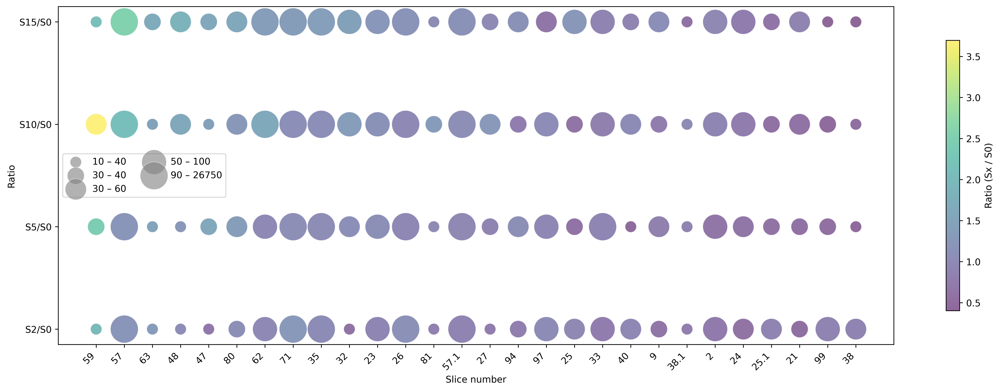

In [84]:
fig=process_and_plot(df_527, cmap='viridis', dpi=600)

fig.savefig('Figures/527.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/527.pdf', dpi=600, bbox_inches='tight')

In [89]:
fig=process_and_plot(df_514, cmap='viridis', dpi=600)

fig.savefig('Figures/514.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/514.pdf', dpi=600, bbox_inches='tight')

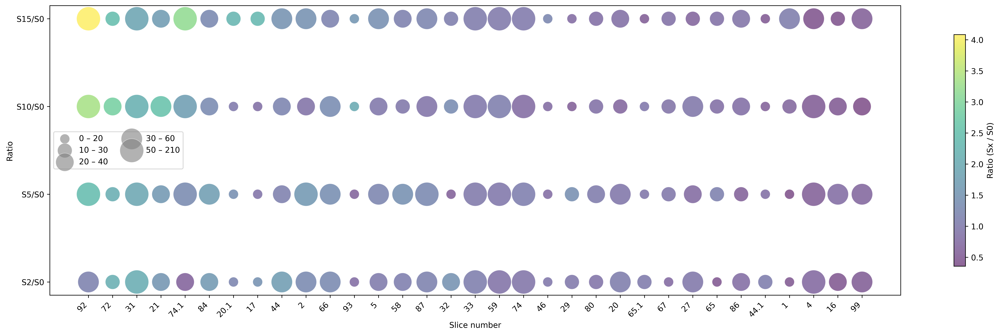

In [90]:
fig=process_and_plot(df_515, cmap='viridis', dpi=600)

fig.savefig('Figures/515.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/515.pdf', dpi=600, bbox_inches='tight')

In [91]:
fig=process_and_plot(df_517, cmap='viridis', dpi=600)

fig.savefig('Figures/517.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/517.pdf', dpi=600, bbox_inches='tight')

In [92]:
fig=process_and_plot(df_535, cmap='viridis', dpi=600)

fig.savefig('Figures/535.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/535.pdf', dpi=600, bbox_inches='tight')